# Support Vector Machine

## **What is Support Vector Machine?**

Support Vector Machine (SVM) is a powerful supervised machine learning algorithm used for both classification and regression tasks. However, it is primarily used for binary classification problems. SVM's objective is to find the optimal boundary (decision boundary) between classes that maximizes the margin, which is the distance between the nearest points of each class (called support vectors) and the decision boundary.

Support Vecotr Machine can be used for Classification and Regression and Outlier Detection. In case of Classification, it is mostly used for both binary and multiclass classification and called SVC (Support Vector Classifier). In case of Regression, it can be used for both binary and multiclass regression and called SVR (Support Vector Regressor). 

## **Key Concepts of Support Vector Machine:**

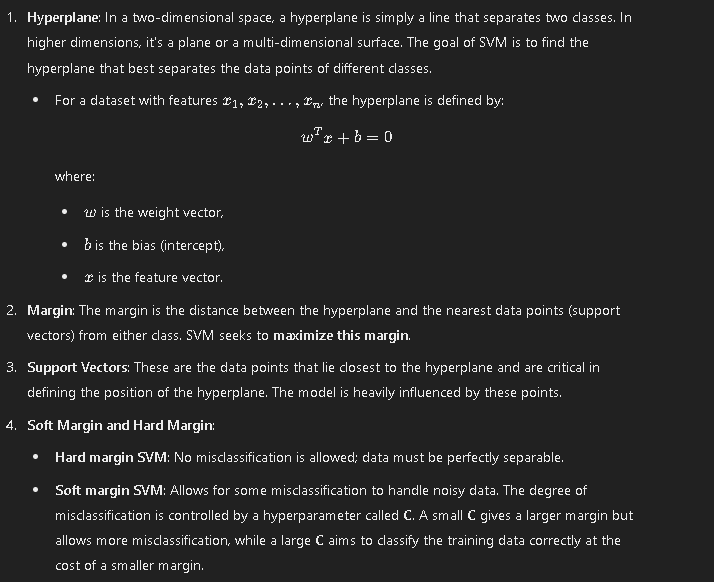

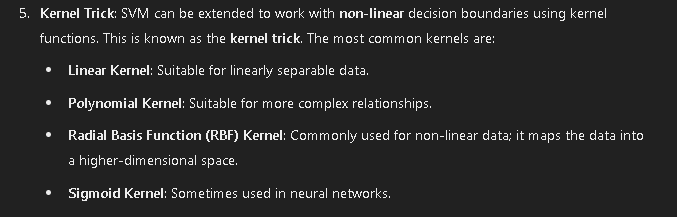

## **Mathematical Formulation:**

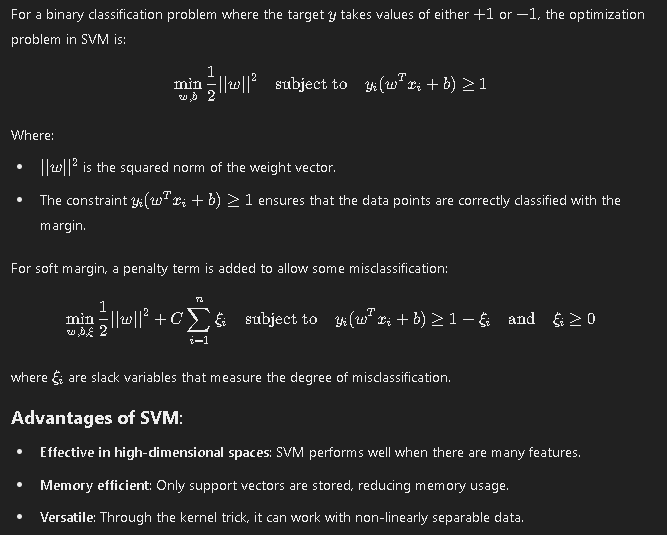

## **Advantages and Disadvantages of Support Vector Machine:**

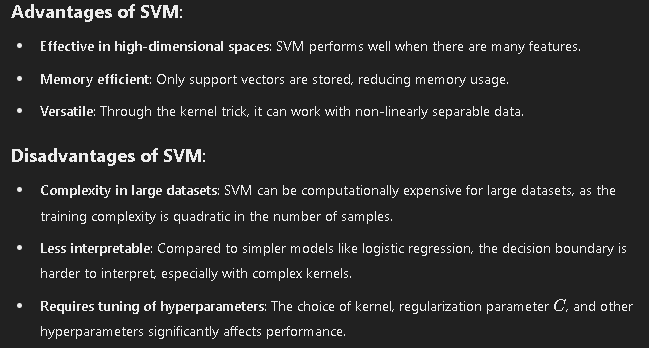

## **Applications of Support Vector Machine:**

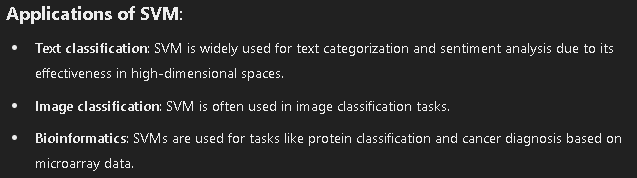

## **Hyperparameters in SVM:**

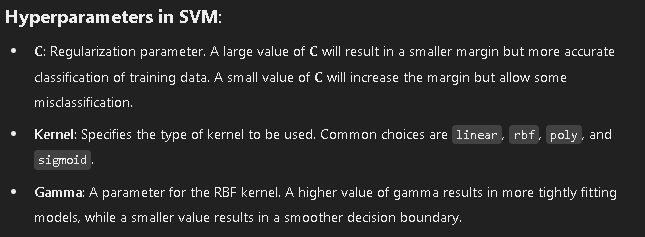

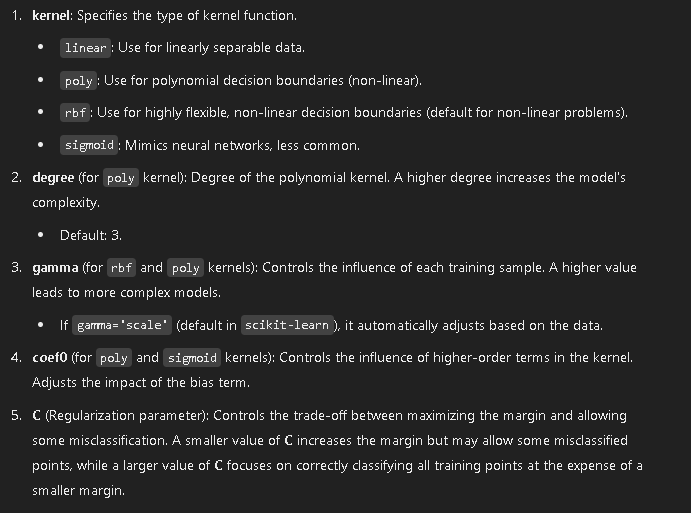

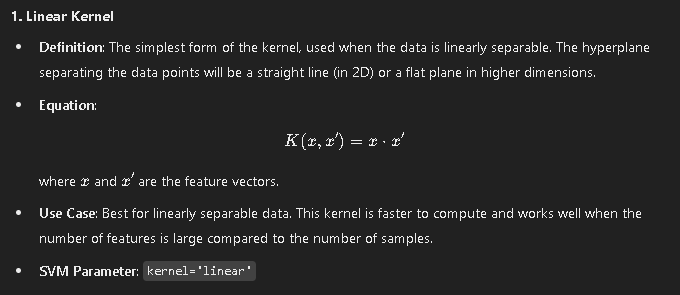

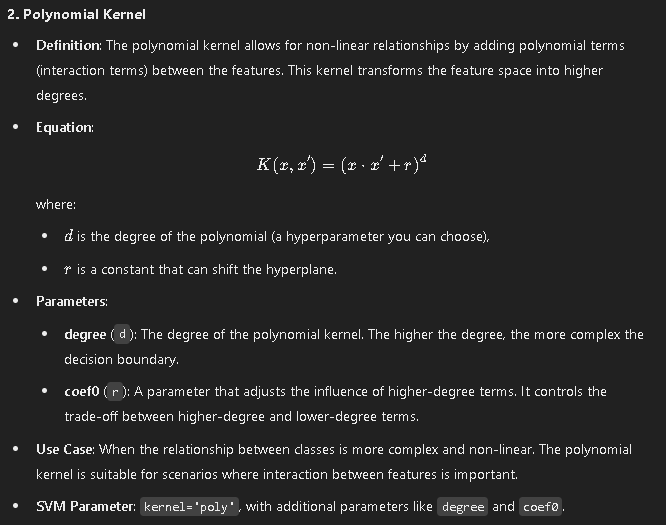

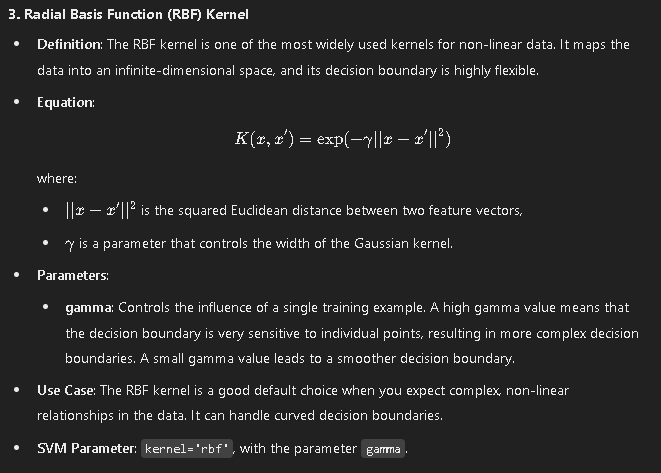

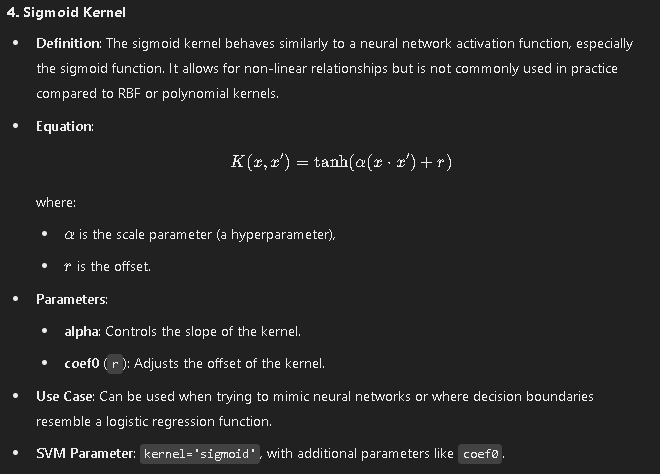

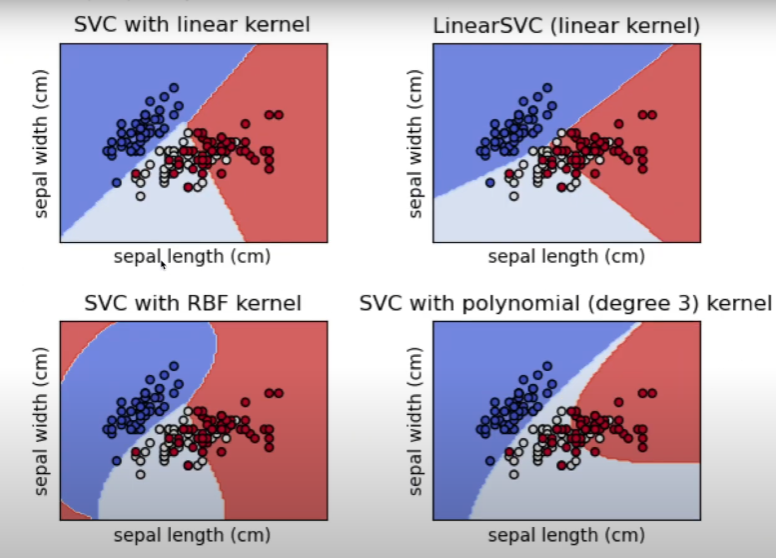

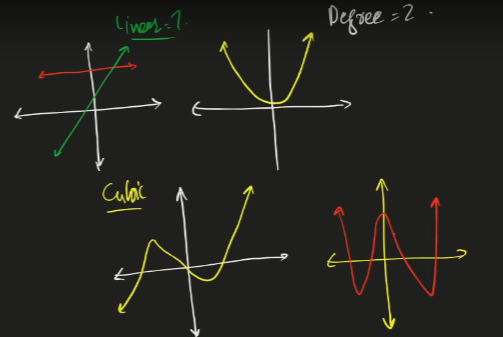

## **Implementation:**

### **SVM with Linear Kernel**

In [1]:
# Importing necessary libraries
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report

# Load the iris dataset (we'll use only two classes for binary classification)
iris = datasets.load_iris()
X = iris.data[iris.target != 2]  # We take only two classes (0 and 1)
y = iris.target[iris.target != 2]

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Create an SVM model with a linear kernel
svm_model = SVC(kernel='linear', C=1.0)

# Train the model
svm_model.fit(X_train, y_train)

# Predict the outcomes for the test set
y_pred = svm_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")
print(f"Classification Report:\n{classification_report(y_test, y_pred)}")

Accuracy: 1.0
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        17
           1       1.00      1.00      1.00        13

    accuracy                           1.00        30
   macro avg       1.00      1.00      1.00        30
weighted avg       1.00      1.00      1.00        30



### **SVM with RBF Kernel**

In [2]:
# Create an SVM model with RBF kernel
svm_rbf_model = SVC(kernel='rbf', C=1.0, gamma='scale')

# Train the model
svm_rbf_model.fit(X_train, y_train)

# Predict and evaluate
y_pred_rbf = svm_rbf_model.predict(X_test)

# Evaluate the RBF kernel model
accuracy_rbf = accuracy_score(y_test, y_pred_rbf)
print(f"Accuracy (RBF Kernel): {accuracy_rbf}")
print(f"Classification Report (RBF Kernel):\n{classification_report(y_test, y_pred_rbf)}")


Accuracy (RBF Kernel): 1.0
Classification Report (RBF Kernel):
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        17
           1       1.00      1.00      1.00        13

    accuracy                           1.00        30
   macro avg       1.00      1.00      1.00        30
weighted avg       1.00      1.00      1.00        30



## **Render of SVM:**

In [1]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from sklearn import datasets
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Load the iris dataset
iris = datasets.load_iris()
X = iris.data[:, :3]  # Use only 3 features for 3D visualization
y = iris.target

# Only keep two classes for binary classification (0 and 1)
X = X[y != 2]
y = y[y != 2]

# Standardize the features
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Train an SVM model with a non-linear (RBF) kernel
svm_model = SVC(kernel='rbf', C=1.0, gamma='scale')
svm_model.fit(X, y)

# Create a 3D grid of points to evaluate the model on
x_range = np.linspace(X[:, 0].min(), X[:, 0].max(), 50)
y_range = np.linspace(X[:, 1].min(), X[:, 1].max(), 50)
z_range = np.linspace(X[:, 2].min(), X[:, 2].max(), 50)
xx, yy, zz = np.meshgrid(x_range, y_range, z_range)
grid = np.c_[xx.ravel(), yy.ravel(), zz.ravel()]

# Predict decision function values for the grid points
decision_function = svm_model.decision_function(grid)
decision_function = decision_function.reshape(xx.shape)

# Create a 3D surface plot for the decision boundary
fig = go.Figure(data=[
    go.Scatter3d(
        x=X[:, 0], y=X[:, 1], z=X[:, 2],
        mode='markers',
        marker=dict(
            size=5,
            color=y,  # Color by class
            colorscale='Viridis',
            opacity=0.8
        ),
        name='Data points'
    ),
    go.Isosurface(
        x=xx.ravel(), y=yy.ravel(), z=zz.ravel(),
        value=decision_function.ravel(),
        isomin=-0.1, isomax=0.1,
        surface_count=1,  # Single surface to represent the decision boundary
        opacity=0.5,
        colorscale='RdBu',
        name='Decision Boundary'
    )
])

# Update layout for better visualization
fig.update_layout(
    scene=dict(
        xaxis_title='Feature 1',
        yaxis_title='Feature 2',
        zaxis_title='Feature 3'
    ),
    title="3D Visualization of SVM Non-linear Hyperplane"
)

# Render the plot
fig.show()

In [2]:
import numpy as np
import plotly.graph_objects as go
from sklearn import datasets
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler

# Load the iris dataset and use the first three features
iris = datasets.load_iris()
X = iris.data[:, :3]  # Use only the first 3 features for 3D visualization
y = iris.target

# Only keep two classes for binary classification (0 and 1)
X = X[y != 2]
y = y[y != 2]

# Standardize the features
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Train an SVM model with a linear kernel
svm_model = SVC(kernel='linear', C=1.0)
svm_model.fit(X, y)

# Get the coefficients and intercept for the hyperplane
coef = svm_model.coef_[0]
intercept = svm_model.intercept_

# Create a grid to plot the decision boundary
x_range = np.linspace(X[:, 0].min(), X[:, 0].max(), 50)
y_range = np.linspace(X[:, 1].min(), X[:, 1].max(), 50)
xx, yy = np.meshgrid(x_range, y_range)

# Calculate the corresponding z for each (x, y) to lie on the hyperplane
# The decision boundary equation is: coef[0]*x + coef[1]*y + coef[2]*z + intercept = 0
# Solving for z: z = -(coef[0]*x + coef[1]*y + intercept) / coef[2]
z = -(coef[0] * xx + coef[1] * yy + intercept) / coef[2]

# Create a 3D scatter plot of the data points
fig = go.Figure(data=[
    go.Scatter3d(
        x=X[:, 0], y=X[:, 1], z=X[:, 2],
        mode='markers',
        marker=dict(
            size=5,
            color=y,  # Color points by class
            colorscale='Viridis',
            opacity=0.8
        ),
        name='Data points'
    ),
    go.Surface(
        x=xx, y=yy, z=z,
        colorscale='RdBu',
        opacity=0.5,
        showscale=False,
        name='Linear Decision Hyperplane'
    )
])

# Update layout for better visualization
fig.update_layout(
    scene=dict(
        xaxis_title='Feature 1',
        yaxis_title='Feature 2',
        zaxis_title='Feature 3'
    ),
    title="3D Visualization of Linear SVM Hyperplane"
)

# Render the plot
fig.show()

## **SVR (Support Vector Regressor) Implementation**

In [5]:
import numpy as np
from sklearn import datasets
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score

# Load the iris dataset and use the first three features
iris = datasets.load_iris()
X = iris.data[:, :3]  # Use only the first 3 features for 3D visualization
y = iris.target

# Only keep two classes for binary classification (0 and 1)
X = X[y != 2]
y = y[y != 2]

# Standardize the features
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Train an SVR model with a linear kernel
svr_model = SVR(kernel='linear', C=1.0)
svr_model.fit(X, y)

# Predict the regression values for the training data
y_pred = svr_model.predict(X)

# Evaluate the regression model
mse = mean_squared_error(y, y_pred)
r2 = r2_score(y, y_pred)

print(f"Mean Squared Error: {mse:.4f}")
print(f"R² Score: {r2:.4f}")


Mean Squared Error: 0.0103
R² Score: 0.9587
